# CNN in Practice with PyTorch

Here we will cover CNN in practice using PyTorch! The elements we will cover here are:

    - Using existing architectures and feature extraction (more in-depth tutorial next week for transfer learning!)
    - Visualizing learned concepts
    - Style transfer
    - Transformers for computer vision!

## Using existing architectures and feature extraction

PyTorch provides a rich set of pre-trained models through `torchvision.models`, which are ready for use and modification.

### Available Pre-trained Models:

`densenet` : DenseNet models in PyTorch.

`efficientnet` : EfficientNet models in PyTorch.

`inception_v3` : Inception V3 model in PyTorch.

`mobilenet_v2` : MobileNet v2 model in PyTorch.

`mobilenet_v3` : MobileNet v3 model in PyTorch.

`resnet` : ResNet models in PyTorch (including ResNet18, ResNet34, ResNet50, ResNet101, ResNet152).

`resnext` : ResNeXt models in PyTorch.

`vgg` : VGG models in PyTorch (including VGG11, VGG13, VGG16, VGG19).

`alexnet` : AlexNet model in PyTorch.

`shufflenet_v2` : ShuffleNet V2 model in PyTorch.

`squeezenet` : SqueezeNet model in PyTorch.


For more details, check out the official PyTorch documentation: https://pytorch.org/docs/stable/torchvision/models.html


In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import torch
from torchvision import datasets, transforms, models
import torch.nn as nn
from torch.utils.data import DataLoader, random_split

In [2]:
# Let's download the purr and woof data!

_URL = 'https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'
path_to_zip = os.path.join('./', 'cats_and_dogs_filtered.zip')
os.system(f'wget {_URL} -O {path_to_zip}')
os.system(f'unzip {path_to_zip} -d ./data')
PATH = os.path.join('./data', 'cats_and_dogs_filtered')

train_dir = os.path.join(PATH, 'train')
validation_dir = os.path.join(PATH, 'validation')

BATCH_SIZE = 32
IMG_SIZE = (160, 160)

--2025-01-07 21:51:07--  https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 172.253.115.207, 172.253.122.207, 172.253.63.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|172.253.115.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68606236 (65M) [application/zip]
Saving to: ‘./cats_and_dogs_filtered.zip’

     0K .......... .......... .......... .......... ..........  0% 9.03M 7s
    50K .......... .......... .......... .......... ..........  0% 31.7M 5s
   100K .......... .......... .......... .......... ..........  0% 22.7M 4s
   150K .......... .......... .......... .......... ..........  0% 18.8M 4s
   200K .......... .......... .......... .......... ..........  0% 61.0M 3s
   250K .......... .......... .......... .......... ..........  0%  123M 3s
   300K .......... .......... .......... .......... ..........  0% 31.1M 3s
   350K .......... ........

Archive:  ./cats_and_dogs_filtered.zip
   creating: ./data/cats_and_dogs_filtered/
  inflating: ./data/cats_and_dogs_filtered/vectorize.py  
   creating: ./data/cats_and_dogs_filtered/validation/
   creating: ./data/cats_and_dogs_filtered/train/
   creating: ./data/cats_and_dogs_filtered/validation/dogs/
  inflating: ./data/cats_and_dogs_filtered/validation/dogs/dog.2127.jpg  
  inflating: ./data/cats_and_dogs_filtered/validation/dogs/dog.2126.jpg  
  inflating: ./data/cats_and_dogs_filtered/validation/dogs/dog.2125.jpg  
  inflating: ./data/cats_and_dogs_filtered/validation/dogs/dog.2124.jpg  
  inflating: ./data/cats_and_dogs_filtered/validation/dogs/dog.2123.jpg  
  inflating: ./data/cats_and_dogs_filtered/validation/dogs/dog.2122.jpg  
  inflating: ./data/cats_and_dogs_filtered/validation/dogs/dog.2121.jpg  
  inflating: ./data/cats_and_dogs_filtered/validation/dogs/dog.2120.jpg  
  inflating: ./data/cats_and_dogs_filtered/validation/dogs/dog.2119.jpg  
  inflating: ./data/cats_and

In [3]:
transform = transforms.Compose([
    transforms.Resize(IMG_SIZE),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = datasets.ImageFolder(train_dir, transform=transform)
validation_dataset = datasets.ImageFolder(validation_dir, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
validation_loader = DataLoader(validation_dataset, batch_size=BATCH_SIZE, shuffle=True)

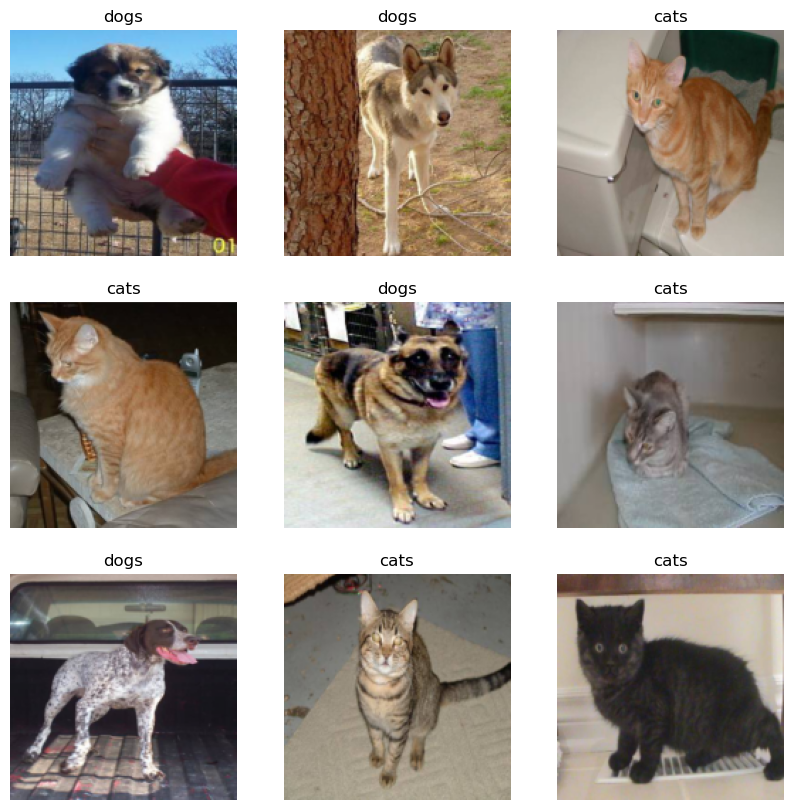

In [6]:
# Let's plot 9 random images
class_names = train_dataset.classes

def denormalize(img, mean, std):
    img = img.numpy().transpose((1, 2, 0))
    mean = np.array(mean)
    std = np.array(std)
    img = std * img + mean
    img = np.clip(img, 0, 1)
    return img

images, labels = next(iter(train_loader))

# Let's plot 9 random images with denormalization
plt.figure(figsize=(10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    denorm_img = denormalize(images[i], mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    plt.imshow(denorm_img)
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [7]:
# As the original dataset doesn't contain a test set, you will create one.
# Split the validation dataset into validation and test sets.

val_size = len(validation_dataset) // 5
test_size = val_size
validation_size = len(validation_dataset) - val_size

validation_dataset, test_dataset = random_split(validation_dataset, [validation_size, test_size])

In [8]:
print('Number of validation batches:', len(validation_loader))
print('Number of test batches:', len(DataLoader(test_dataset, batch_size=BATCH_SIZE)))

Number of validation batches: 32
Number of test batches: 7


In [9]:
# Let's apply what we learned and use data augmentation!
data_augmentation = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(20)
])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.1519828].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.1519828].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.1519828].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.1519828].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.1519828].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.1519828].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.15

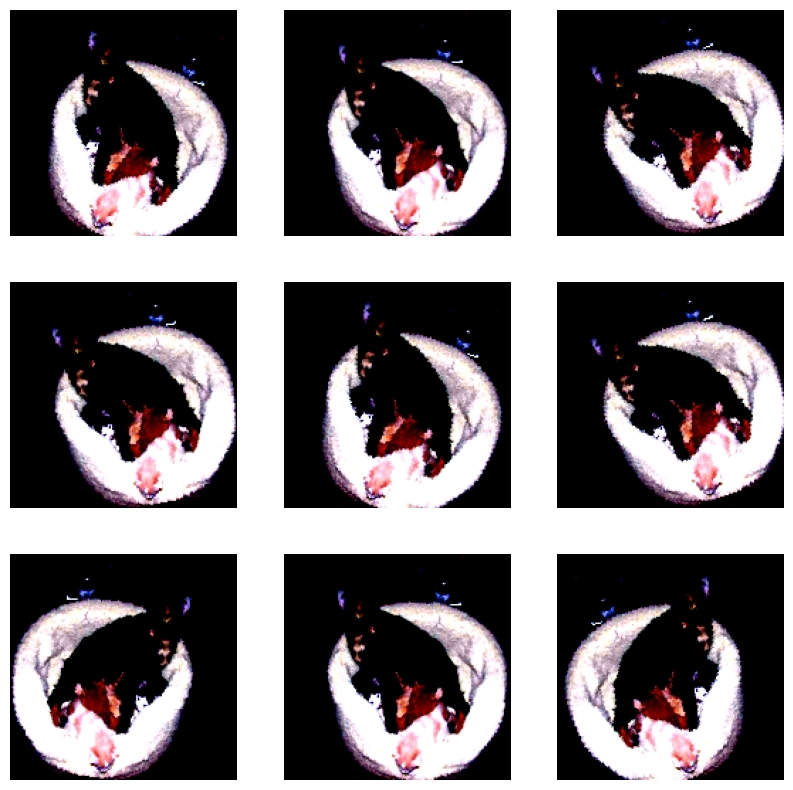

In [10]:
for image, _ in train_loader:
    plt.figure(figsize=(10, 10))
    first_image = image[5]
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        augmented_image = data_augmentation(first_image)
        denorm_img = denormalize(augmented_image, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        plt.imshow(augmented_image.permute(1, 2, 0).numpy())
        plt.axis('off')
    break

In [11]:
# Preprocessing with normalization similar to MobileNets

preprocess_input = transforms.Compose([
    transforms.Normalize(mean=[-0.485, -0.456, -0.406], std=[1/0.229, 1/0.224, 1/0.225])
])

In [12]:
# Create the base model from the MobileNet V2 model pre-trained on ImageNet
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
base_model = models.mobilenet_v2(pretrained=True)
base_model = base_model.features.to(device)
base_model.eval()

# Let's see what it looks like!
print(base_model)

/home/ubuntu/data/anaconda3/envs/mat/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/ubuntu/data/anaconda3/envs/mat/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Sequential(
  (0): Conv2dNormActivation(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU6(inplace=True)
  )
  (1): InvertedResidual(
    (conv): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU6(inplace=True)
      )
      (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (2): InvertedResidual(
    (conv): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(16, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (

## Feature extraction
We reuse an existing CNN on a new dataset throough feature extraction. This is a very useful technique when working with small datasets.

In [13]:
# This feature extractor converts each 160x160x3 image into a feature map
image_batch, label_batch = next(iter(train_loader))
image_batch = image_batch.to(device)
feature_batch = base_model(image_batch)
print(feature_batch.shape)
# Note: 32 is a batch size!

torch.Size([32, 1280, 5, 5])


### Important note: should we stop here?
No! We should fine tune our model with the cats and dogs data. This wil be covered n eth next lecture in transfer learning!

## Visualizing learned concepts
    - Visualizing intermediate convnet outputs
    - Visualizing convnets filters
    - (GradCAM) Visualizing heatmaps of class activation in an image
    

Let's visualize intermediate convnet outputs

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 9912422/9912422 [00:00<00:00, 144602116.20it/s]


Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 28881/28881 [00:00<00:00, 32174155.07it/s]

Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 1648877/1648877 [00:00<00:00, 135736126.80it/s]


Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 4542/4542 [00:00<00:00, 4943053.65it/s]


Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



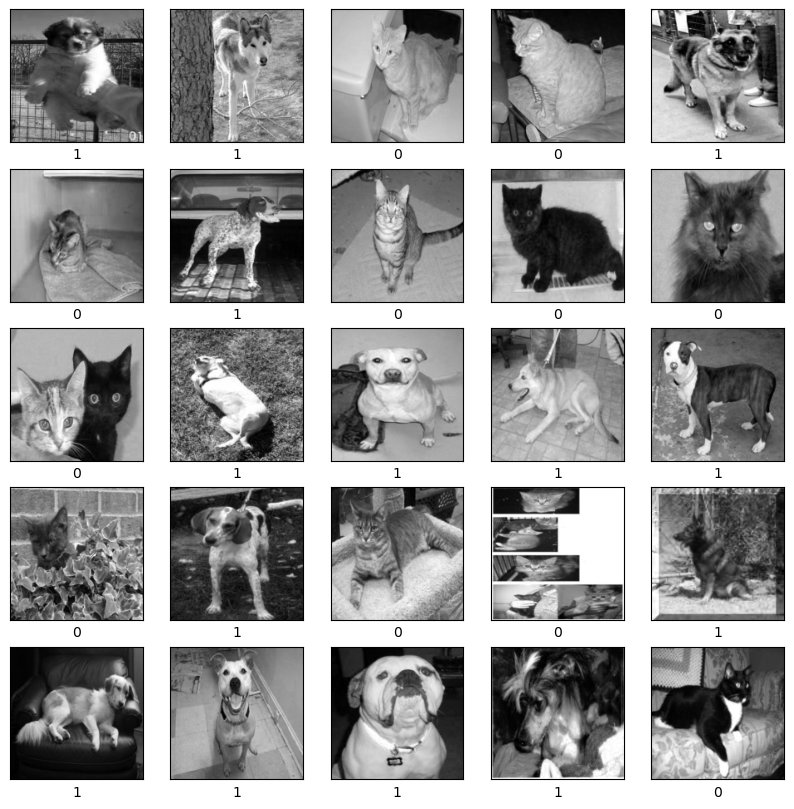

CNNModel(
  (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1))
  (fc1): Linear(in_features=800, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=10, bias=True)
)
Epoch 1, Loss: 0.15627569757190843
Epoch 2, Loss: 0.05377559026518526
Epoch 3, Loss: 0.04149087282403683


In [14]:
import matplotlib.pyplot as plt
import numpy as np
import os
torch
from torchvision import datasets, transforms, models
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split

# Load the MNIST dataset
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))  # Normalize to mean=0.5, std=0.5
])

train_dataset = datasets.MNIST(root='./data', train=True, transform=transform, download=True)
test_dataset = datasets.MNIST(root='./data', train=False, transform=transform, download=True)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Visualize 25 images
plt.figure(figsize=(10, 10))
train_images, train_labels = next(iter(train_loader))
for i in range(25):
    plt.subplot(5, 5, i + 1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(images[i][0], cmap='gray')  # MNIST images are single-channel
    plt.xlabel(str(labels[i].item()))
plt.show()

# Define the model
class CNNModel(nn.Module):
    def __init__(self):
        super(CNNModel, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3)
        self.pool = nn.MaxPool2d(kernel_size=2)
        self.conv2 = nn.Conv2d(32, 32, kernel_size=3)
        self.fc1 = nn.Linear(32 * 5 * 5, 128)
        self.fc2 = nn.Linear(128, 10)

    def forward(self, x):
        x = self.pool(nn.functional.relu(self.conv1(x)))
        x = self.pool(nn.functional.relu(self.conv2(x)))
        x = torch.flatten(x, 1)
        x = nn.functional.dropout(x, p=0.2, training=self.training)
        x = nn.functional.relu(self.fc1(x))
        x = self.fc2(x)
        return x

model = CNNModel()
model.to('cuda' if torch.cuda.is_available() else 'cpu')
print(model)

# Define the optimizer and loss function
optimizer = optim.Adam(model.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss()

def train_model(model, train_loader, criterion, optimizer, epochs):
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    model.to(device)
    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
        print(f"Epoch {epoch + 1}, Loss: {running_loss / len(train_loader)}")

train_model(model, train_loader, criterion, optimizer, epochs=3)

In [15]:
#Let's test its accuracy!
def test_model(model, test_loader):
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    model.to(device)
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    print(f"Test Accuracy: {100 * correct / total}%")

test_model(model, test_loader)


Test Accuracy: 98.9%


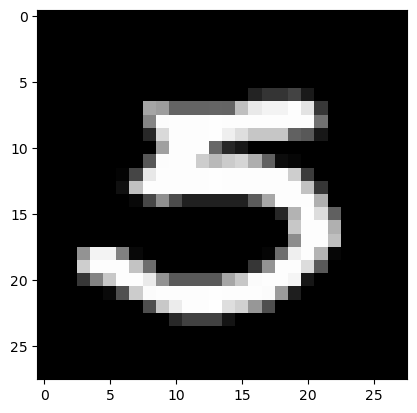

In [16]:
# Reshape train_images (already in correct shape for PyTorch)
train_images = train_images.view(-1, 1, 28, 28)

# Visualize a single image
plt.imshow(train_images[1].squeeze().cpu().numpy(), cmap='gray')
plt.show()

Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1))
MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1))
(1, 32, 26, 26)


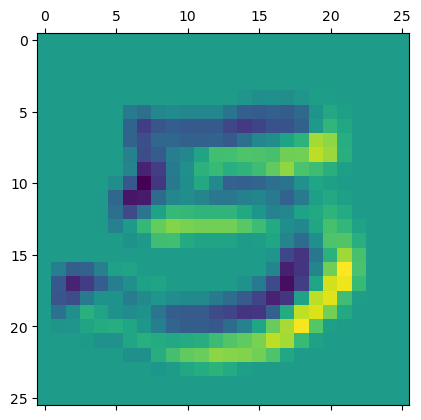

In [17]:
# Move input data to the same device as the model
train_images, train_labels = train_images.to(device), train_labels.to(device)

# Extract layer outputs
layer_outputs = [layer for layer in model.children()][:3]
activations = []
x = train_images[1].unsqueeze(0)
for layer in layer_outputs:
    print(layer)
    x = layer(x)
    activations.append(x)

# Visualize activations of the first layer
first_layer_activation = activations[0].detach().cpu().numpy()
print(first_layer_activation.shape)

plt.matshow(first_layer_activation[0, 0, :, :], cmap='viridis')
plt.show()

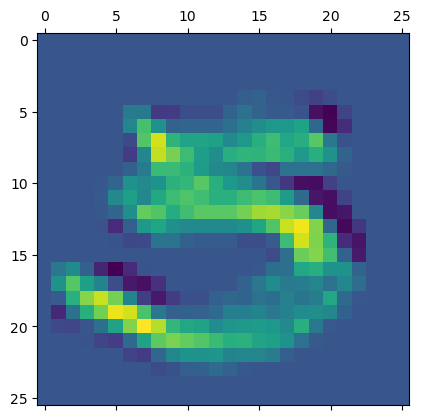

In [18]:
plt.matshow(first_layer_activation[0, 8, :, :], cmap='viridis')

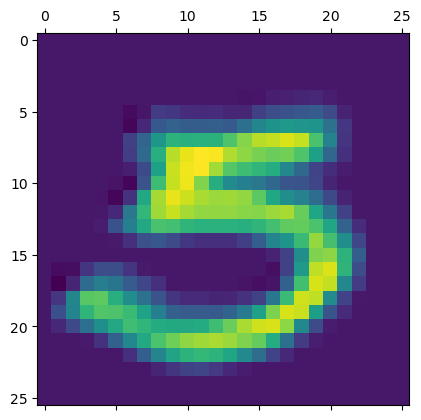

In [19]:
plt.matshow(first_layer_activation[0, 12, :, :], cmap='viridis')

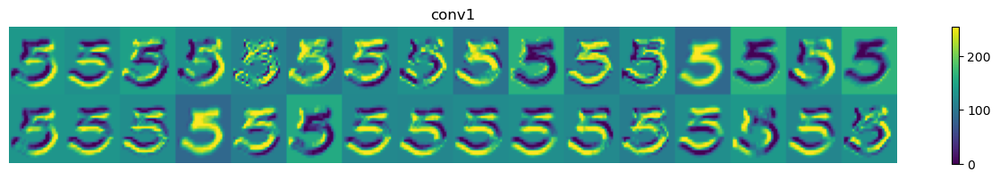

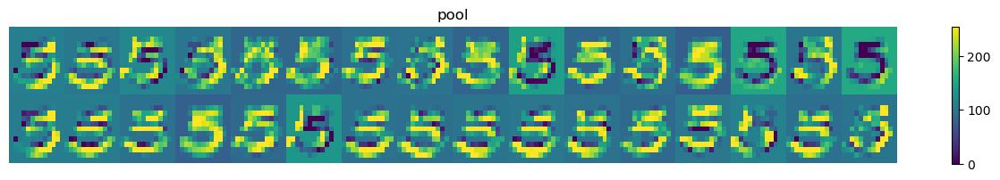

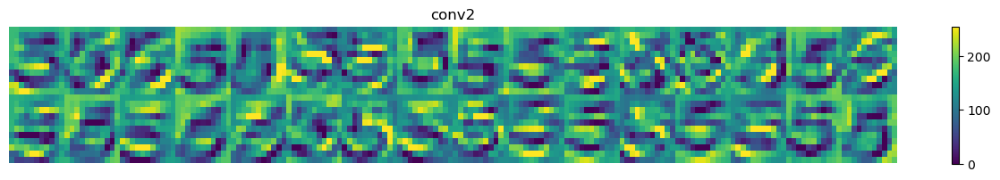

In [20]:
# Visualize multiple activations
layer_names = [name for name, _ in model.named_children()][:4]
images_per_row = 16

for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[1]
    size = layer_activation.shape[2]
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0, col * images_per_row + row].detach().cpu().numpy()
            channel_image -= channel_image.mean()
            channel_image /= (channel_image.std() + 1e-5)
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size:(col + 1) * size, row * size:(row + 1) * size] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    plt.colorbar()
    plt.axis('off')
    plt.savefig(f'Layer_Activations_{layer_name}.png', bbox_inches='tight', dpi=300)


## Now let's visualize CNN filters

In [21]:
print(model)

CNNModel(
  (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1))
  (fc1): Linear(in_features=800, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=10, bias=True)
)


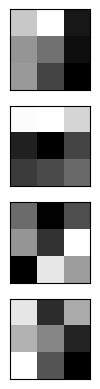

In [22]:
# Visualize filters of the first convolutional layer
filters = model.conv1.weight.data.cpu().numpy()
f_min, f_max = filters.min(), filters.max()
filters = (filters - f_min) / (f_max - f_min)

n_filters, ix = 4, 1
for i in range(n_filters):
    f = filters[i, 0, :, :]
    ax = plt.subplot(n_filters, 1, ix)
    ax.set_xticks([])
    ax.set_yticks([])
    plt.imshow(f, cmap='gray')
    ix += 1
plt.show()

## Grad-CAM class activation visualization

- This is, in my opinion, the most important visualization of all!

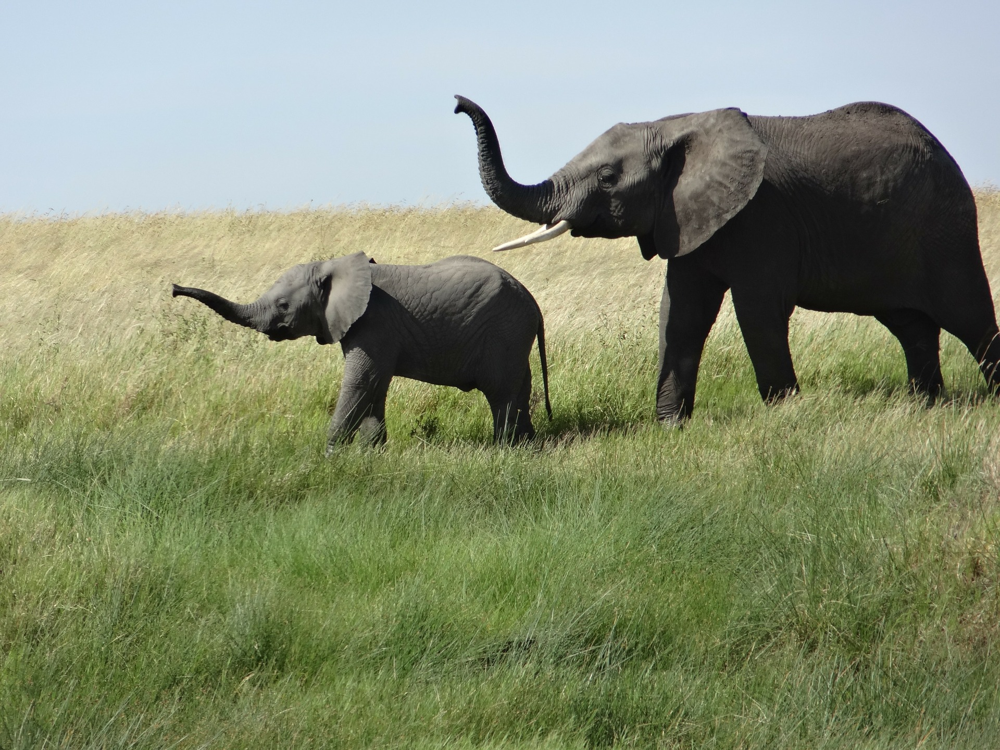

In [24]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, transforms
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Display
from IPython.display import display

# Load pre-trained model
model = models.efficientnet_v2_s(pretrained=True)
model.eval()

img_size = (224, 224)  # Adjusted for EfficientNetV2
last_conv_layer_name = "features"  # Adjusted for EfficientNetV2

# The local path to our target image
img_path = "./imgs/african_elephant.png"

# Display the image
display(Image.open(img_path))

## The Grad-CAM algorithm
https://arxiv.org/pdf/1610.02391.pdf

In [25]:
# Preprocessing function
def preprocess_image(img_path, size):
    transform = transforms.Compose([
        transforms.Resize(size),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    img = Image.open(img_path).convert('RGB')
    return transform(img).unsqueeze(0)

# Generate Grad-CAM heatmap
def make_gradcam_heatmap(img_tensor, model, target_layer, class_idx=None):
    # Hook the gradients of the target layer
    gradients = []
    activations = []

    def hook_function(module, input, output):
        activations.append(output)

    def backward_hook(module, grad_in, grad_out):
        gradients.append(grad_out[0])

    target_layer.register_forward_hook(hook_function)
    target_layer.register_backward_hook(backward_hook)

    # Forward pass
    output = model(img_tensor)
    if class_idx is None:
        class_idx = torch.argmax(output, dim=1).item()

    # Backward pass
    model.zero_grad()
    target = output[:, class_idx]
    target.backward()

    # Compute Grad-CAM
    gradients = gradients[0]
    activations = activations[0]
    pooled_gradients = torch.mean(gradients, dim=[0, 2, 3])

    for i in range(activations.shape[1]):
        activations[:, i, :, :] *= pooled_gradients[i]

    heatmap = torch.mean(activations, dim=1).squeeze()
    heatmap = F.relu(heatmap)
    heatmap /= torch.max(heatmap)
    return heatmap.cpu().detach().numpy()

/home/ubuntu/data/anaconda3/envs/mat/lib/python3.10/site-packages/torch/nn/modules/module.py:1359: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


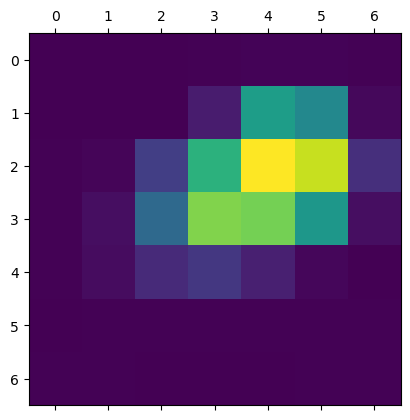

In [26]:
# Prepare image
img_tensor = preprocess_image(img_path, img_size)

# Identify the target layer
target_layer = dict([*model.named_modules()])[last_conv_layer_name]

# Generate heatmap
heatmap = make_gradcam_heatmap(img_tensor, model, target_layer)

# Display heatmap
plt.matshow(heatmap)
plt.show()

/tmp/ipykernel_907345/2619751795.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('jet')


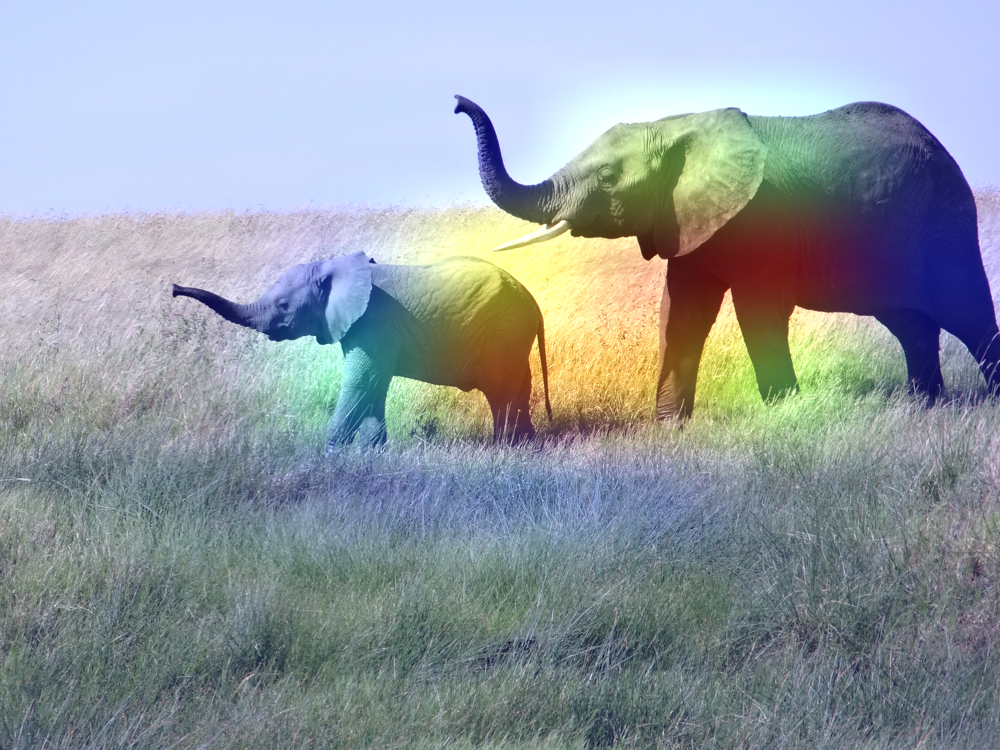

In [27]:
# Save and display Grad-CAM
def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    """
    Overlays a Grad-CAM heatmap on an image and saves/displays the result.

    Parameters:
    - img_path (str): Path to the original image.
    - heatmap (numpy.ndarray): 2D or 3D array representing the heatmap.
    - cam_path (str): Path to save the superimposed image.
    - alpha (float): Transparency factor for the heatmap overlay.
    """
    # Load the original image and convert it to RGB
    img = Image.open(img_path).convert('RGB')
    img = np.array(img)

    # Ensure the heatmap is a 2D array
    if heatmap.ndim == 3:
        heatmap = np.mean(heatmap, axis=-1)

    # Normalize the heatmap to the range [0, 1]
    heatmap = heatmap - np.min(heatmap)
    heatmap = heatmap / (np.max(heatmap) + 1e-8)  # Prevent division by zero

    # Apply the 'jet' colormap to the heatmap
    colormap = cm.get_cmap('jet')
    heatmap_colored = colormap(heatmap)[:, :, :3]  # Extract RGB channels
    heatmap_colored = np.uint8(255 * heatmap_colored)  # Scale to [0, 255]

    # Convert the heatmap to a PIL image and resize to match the original image
    heatmap_colored = Image.fromarray(heatmap_colored).resize((img.shape[1], img.shape[0]))
    heatmap_colored = np.array(heatmap_colored)

    # Superimpose the heatmap on the original image
    superimposed_img = heatmap_colored * alpha + img
    superimposed_img = np.clip(superimposed_img, 0, 255).astype(np.uint8)  # Ensure valid pixel range
    superimposed_img = Image.fromarray(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display the Grad-CAM image
    superimposed_img.show()

save_and_display_gradcam(img_path, heatmap)


## Style transfer

Here we will use deep learning to compose one image in the style of another image:
https://arxiv.org/pdf/1508.06576.pdf

In [28]:
import os
import torch
from torchvision import models, transforms
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import time

mpl.rcParams['figure.figsize'] = (12, 12)
mpl.rcParams['axes.grid'] = False

In [29]:
# Function to convert tensor to image
def tensor_to_image(tensor):
    tensor = tensor.detach().cpu().numpy()
    tensor = np.moveaxis(tensor, 0, -1)  # Convert from CHW to HWC
    tensor = np.clip(tensor * 255, 0, 255).astype(np.uint8)
    return Image.fromarray(tensor)

# Load images
def load_image(path, max_dim=256):
    image = Image.open(path).convert('RGB')
    transform = transforms.Compose([
        transforms.Resize(max_dim),
        transforms.ToTensor(),
        transforms.Lambda(lambda x: x.unsqueeze(0))  # Add batch dimension
    ])
    return transform(image)

In [30]:
# Display images
def imshow(image, title=None):
    image = tensor_to_image(image.squeeze(0))
    plt.imshow(image)
    if title:
        plt.title(title)

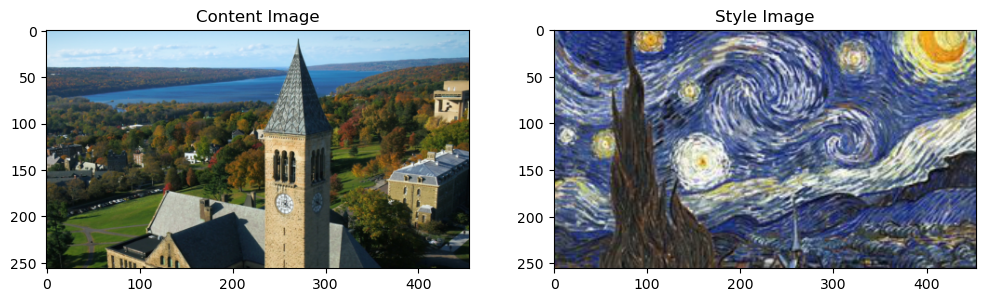

In [31]:
style_path = "./imgs/van.jpg"
content_path = "./imgs/tower.jpg"

style_image = load_image(style_path)
content_image = load_image(content_path)

plt.subplot(1, 2, 1)
imshow(content_image, "Content Image")

plt.subplot(1, 2, 2)
imshow(style_image, "Style Image")

In [32]:
# Let's break it down with VGG19

# Load a VGG19 and test run it on our image to ensure it's used correctly
from torchvision import models, transforms
import torch
import torch.nn.functional as F

preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
x = content_image

vgg = models.vgg19(pretrained=True)
vgg.eval()
# Get the top-5 predictions and their probabilities
prediction_probabilities = F.softmax(vgg(x), dim=1)
top_probs, top_indices = torch.topk(prediction_probabilities, 5)

# Use the indices to map to class names (requires a class mapping dictionary)
class_map = {idx: f"Class_{idx}" for idx in range(1000)}  # Placeholder class map
top_classes = [class_map[idx.item()] for idx in top_indices[0]]

# Display class names and probabilities
print([(class_name, prob.item()) for class_name, prob in zip(top_classes, top_probs[0])])

# Remove top layers for feature extraction
vgg = models.vgg19(pretrained=True).features

/home/ubuntu/data/anaconda3/envs/mat/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[('Class_497', 0.3481045365333557), ('Class_442', 0.11099673807621002), ('Class_682', 0.08160396665334702), ('Class_835', 0.05682484805583954), ('Class_663', 0.04352601245045662)]


In [33]:
for layer in vgg:
    print(layer)


Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU(inplace=True)
Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU(inplace=True)
MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU(inplace=True)
Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU(inplace=True)
MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU(inplace=True)
Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU(inplace=True)
Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU(inplace=True)
Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU(inplace=True)
MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ReLU(inplace=True

In [34]:
# Let's now choose intermediate layers from the network to represent
# the style and content of the image

content_layers = ['21']  # Corresponds to block5_conv2 in PyTorch
style_layers = ['0', '5', '10', '19', '28']  # Corresponds to specific conv layers in PyTorch

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)


In [35]:
# Build the model
class VGGIntermediate(torch.nn.Module):
    def __init__(self, layer_names):
        super(VGGIntermediate, self).__init__()
        self.vgg = models.vgg19(pretrained=True).features.eval()
        self.layer_names = layer_names

    def forward(self, x):
        outputs = []
        for name, layer in self.vgg._modules.items():
            x = layer(x)
            if name in self.layer_names:
                outputs.append(x)
        return outputs

In [36]:
# And to create the model:

style_extractor = VGGIntermediate(style_layers)
style_outputs = style_extractor(x * 255.0)

# Look at the statistics of each layer's output
for name, output in zip(style_layers, style_outputs):
    print(name)
    print("  shape: ", output.shape)
    print("  min: ", output.min().item())
    print("  max: ", output.max().item())
    print("  mean: ", output.mean().item())
    print()

0
  shape:  torch.Size([1, 64, 256, 455])
  min:  0.0
  max:  929.09326171875
  mean:  14.282233238220215

5
  shape:  torch.Size([1, 128, 128, 227])
  min:  0.0
  max:  2334.5849609375
  mean:  43.76307678222656

10
  shape:  torch.Size([1, 256, 64, 113])
  min:  0.0
  max:  3881.64208984375
  mean:  70.26203155517578

19
  shape:  torch.Size([1, 512, 32, 56])
  min:  0.0
  max:  3551.0458984375
  mean:  43.011470794677734

28
  shape:  torch.Size([1, 512, 16, 28])
  min:  0.0
  max:  1111.1776123046875
  mean:  15.550554275512695



In [37]:
# Calculate a Gram matrix for computing the style

def gram_matrix(input_tensor):
    b, c, h, w = input_tensor.size()
    features = input_tensor.view(b, c, h * w)
    G = torch.bmm(features, features.transpose(1, 2))
    return G / (c * h * w)

In [38]:
# Build a model that returns the style and content tensors

class StyleContentModel(torch.nn.Module):
    def __init__(self, style_layers, content_layers):
        super(StyleContentModel, self).__init__()
        self.vgg = VGGIntermediate(style_layers + content_layers)
        self.style_layers = style_layers
        self.content_layers = content_layers

    def forward(self, inputs):
        inputs = inputs * 255.0
        outputs = self.vgg(inputs)
        style_outputs, content_outputs = outputs[:len(self.style_layers)], outputs[len(self.style_layers):]

        # No detach here; retain computation graph
        style_outputs = [gram_matrix(output) for output in style_outputs]

        style_dict = {name: value for name, value in zip(self.style_layers, style_outputs)}
        content_dict = {name: value for name, value in zip(self.content_layers, content_outputs)}

        return {'content': content_dict, 'style': style_dict}

In [39]:
# Finalize the calculation

extractor = StyleContentModel(style_layers, content_layers)
results = extractor(x)

print('Styles:')
for name, output in results['style'].items():
    print("  ", name)
    print("    shape: ", output.shape)
    print("    min: ", output.min().item())
    print("    max: ", output.max().item())
    print("    mean: ", output.mean().item())
    print()

print("Contents:")
for name, output in results['content'].items():
    print("  ", name)
    print("    shape: ", output.shape)
    print("    min: ", output.min().item())
    print("    max: ", output.max().item())
    print("    mean: ", output.mean().item())

Styles:
   0
    shape:  torch.Size([1, 64, 64])
    min:  0.0
    max:  320.084228515625
    mean:  4.629677772521973

   5
    shape:  torch.Size([1, 128, 128])
    min:  0.0
    max:  3863.429443359375
    mean:  19.156627655029297

   10
    shape:  torch.Size([1, 256, 256])
    min:  0.0
    max:  2771.381591796875
    mean:  23.255659103393555

   19
    shape:  torch.Size([1, 512, 512])
    min:  0.0
    max:  1800.6824951171875
    mean:  4.22042179107666

   28
    shape:  torch.Size([1, 512, 512])
    min:  0.0
    max:  555.8952026367188
    mean:  2.0265421867370605

Contents:
   21
    shape:  torch.Size([1, 512, 16, 28])
    min:  0.0
    max:  1111.1776123046875
    mean:  15.550554275512695


In [40]:
# Set your style and content target values
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

In [41]:
# Define a torch.Tensor to contain the image to optimize
image = content_image.clone().detach().requires_grad_(True)

In [42]:
# Helper function keeping pixel values between 0 and 1
def clip_0_1(image):
    return torch.clamp(image, 0.0, 1.0)

In [43]:
# Let's optimize now!
opt = torch.optim.Adam([image], lr=0.02, betas=(0.99, 0.99), eps=1e-1)

In [44]:
# Let's use a weighted combination of the two losses to get the total loss
style_weight = 1e-1
content_weight = 1e2

In [45]:
# Loss function
def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = sum([F.mse_loss(style_outputs[name], style_targets[name]) for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers

    content_loss = sum([F.mse_loss(content_outputs[name], content_targets[name]) for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers

    loss = style_loss + content_loss
    return loss

 Loss: 34.3666
 Loss: 5318.0669
 Loss: 85515.5078


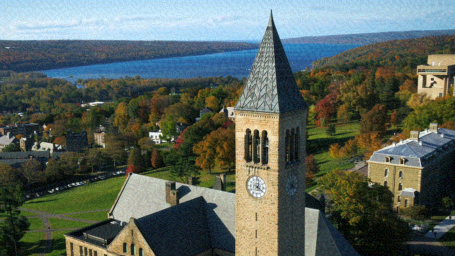

In [46]:
# Update the image with gradient descent
def train_step(image):
    opt.zero_grad()
    outputs = extractor(image) 
    loss = style_content_loss(outputs)
    loss.backward(retain_graph=True) 
    opt.step()
    image.data = clip_0_1(image.data)
    print(f" Loss: {loss.item():.4f}")

    return image

# Run a test
image = train_step(image)
image = train_step(image)
image = train_step(image)
image_show = tensor_to_image(image.squeeze(0))
display(image_show)

 Loss: 36274.9844
. Loss: 26162.1777
. Loss: 19986.8652
. Loss: 16898.0137
. Loss: 14336.2324
. Loss: 12880.2568
. Loss: 11937.2549
. Loss: 11049.1104
. Loss: 10403.4346
. Loss: 9826.4717
. Loss: 9326.6201
. Loss: 8871.6289
. Loss: 8477.8867
. Loss: 8173.5386
. Loss: 7889.9243
. Loss: 7646.3438
. Loss: 7445.9736
. Loss: 7257.4819
. Loss: 7105.9160
. Loss: 6947.4492
. Loss: 6787.8198
. Loss: 6644.6973
. Loss: 6508.3550
. Loss: 6367.3047
. Loss: 6231.0210
. Loss: 6133.8555
. Loss: 6050.1978
. Loss: 5962.5913
. Loss: 5871.6738
. Loss: 5785.7144
. Loss: 5701.6802
. Loss: 5625.7568
. Loss: 5562.7783
. Loss: 5497.9141
. Loss: 5430.9263
. Loss: 5371.5635
. Loss: 5320.1968
. Loss: 5263.4414
. Loss: 5208.0654
. Loss: 5164.9380
. Loss: 5120.9648
. Loss: 5071.4004
. Loss: 5024.6392
. Loss: 4986.0327
. Loss: 4944.5532
. Loss: 4905.0005
. Loss: 4877.5464
. Loss: 4852.2935
. Loss: 4821.2622
. Loss: 4789.5781
. Loss: 4755.2881
. Loss: 4722.9131
. Loss: 4697.0527
. Loss: 4670.7998
. Loss: 4638.3521
. 

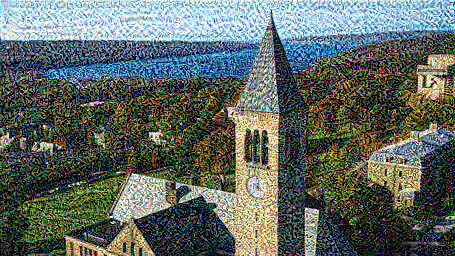

In [47]:
# Let's optimize longer
import time

start = time.time()
epochs = 20
steps_per_epoch = 3

for epoch in range(epochs):
    for step in range(steps_per_epoch):
        image = train_step(image)
        print(".", end='', flush=True)

end = time.time()
print("Total time: {:.1f}".format(end - start))

image_show = tensor_to_image(image.squeeze(0))
display(image_show)

## Transfomers for computer vision!

The benefit of using CNNs was that they avoided the need for hand-designed visual features, instead learning to perform tasks directly from data “end to end”. However, while CNNs avoid hand-crafted feature-extraction, the architecture itself is designed specifically for images and can be computationally demanding. Looking forward to the next generation of scalable vision models, one might ask whether this domain-specific design is necessary, or if one could successfully leverage more domain agnostic and computationally efficient architectures to achieve state-of-the-art results.


As a first step in this direction, we present the Vision Transformer (ViT), a vision model based as closely as possible on the Transformer architecture originally designed for text-based tasks. ViT represents an input image as a sequence of image patches, similar to the sequence of word embeddings used when applying Transformers to text, and directly predicts class labels for the image. ViT demonstrates excellent performance when trained on sufficient data, outperforming a comparable state-of-the-art CNN with four times fewer computational resources. To foster additional research in this area, we have open-sourced both the code and models.


![title](https://1.bp.blogspot.com/-22abISBMshg/X8gOBO9L-II/AAAAAAAAG3A/Qaj26A1iB0AXNKzFYMTywOWyufvIUtZrACLcBGAsYHQ/s16000/ViTPerformance.png)

![title](https://1.bp.blogspot.com/-IE38A38xij0/X8gOLbbSVVI/AAAAAAAAG3E/cIbWNUapSI4r8JYleuIg7JsxsG5fEQ_LQCLcBGAsYHQ/s16000/image2.png)

Source:
https://ai.googleblog.com/2020/12/transformers-for-image-recognition-at.html
